# Check dataflow (multi-input)

In [1]:
# !pip install --upgrade albumentations

In [2]:
import sys
sys.path.insert(0, "../code")

In [3]:
data_path = "../input/train_tiles/"
csv_path = "../input/train_tiles/tile_stats.csv"

In [6]:
import pandas as pd


df = pd.read_csv(csv_path)

In [7]:
df.head()

,index,img_min,img_max,img_mean,img_std,target_ratio,fold_index,skip,img_path
0,0,"(0.0, 0.0, 0.0)","(0.0, 0.0, 0.0)","(0.0, 0.0, 0.0)","(0.0, 0.0, 0.0)",0.000000,1,True,../input/train_tiles/images/20150408_38RPV_2_s...
1,1,"(0.00021996126, -0.0054738754, -0.0023031803)","(0.7458129, 3.2923973, 2.019105)","(0.0058296947, 0.026576746, 0.016203113)","(0.005033476, 0.02942681, 0.016364736)",0.000000,1,False,../input/train_tiles/images/20150408_38RPV_2_s...
2,2,"(0.0, 0.0, 0.0)","(0.21879235, 2.8722415, 1.4715494)","(0.013404857, 0.06091028, 0.037157908)","(0.016068378, 0.07856842, 0.044496164)",0.002460,1,False,../input/train_tiles/images/20150408_38RPV_2_s...
3,3,"(0.00023603518, 0.0012849291, 0.004304498)","(0.26368228, 4.673476, 2.3654168)","(0.022346808, 0.10128883, 0.061817892)","(0.015562968, 0.07138626, 0.038698178)",0.003868,1,False,../input/train_tiles/images/20150408_38RPV_2_s...
4,4,"(0.00023603518, -0.00090447697, 0.0026229876)","(0.25415438, 3.336488, 1.6894587)","(0.021353591, 0.09988875, 0.060620666)","(0.0147406515, 0.067181095, 0.036391318)",0.000889,1,False,../input/train_tiles/images/20150408_38RPV_2_s...


In [23]:
df['tile_id'] = df['img_path'].apply(lambda s: str(s).split('/')[-1][:-4])

In [36]:
m = df['fold_index'] == 1
m2 = df['tile_id'] == 'tile_1427_1427'

In [37]:
df[m & m2].head()

,index,img_min,img_max,img_mean,img_std,target_ratio,fold_index,skip,img_path,city,tile_id
48,48,"(0.00032259902, -0.044647, -0.018692696)","(0.30522382, 13.039524, 6.538927)","(0.018827539, 0.10572312, 0.06227596)","(0.015993394, 0.09754864, 0.051746532)",0.015877,1,False,../input/train_tiles/images/20150408_38RPV_2_s...,20150408_38RPV_2_s1a_38RPV_3b_ASC_20150408t145...,tile_1427_1427
577,577,"(-0.0025135952, -0.08285517, -0.035070825)","(0.67713284, 16.074865, 8.132713)","(0.013385134, 0.08667563, 0.050030157)","(0.011859909, 0.08947206, 0.04716506)",0.015877,1,False,../input/train_tiles/images/s1a_38RPV_3b_ASC_2...,s1a_38RPV_3b_ASC_20150114t145841_tiles,tile_1427_1427
1106,1106,"(0.00032259902, -0.044647, -0.018692696)","(0.30522382, 13.039524, 6.538927)","(0.018827539, 0.10572312, 0.06227596)","(0.015993394, 0.09754864, 0.051746532)",0.015877,1,False,../input/train_tiles/images/s1a_38RPV_3b_ASC_2...,s1a_38RPV_3b_ASC_20150408t145842_tiles,tile_1427_1427
1635,1635,"(0.00026077696, -0.08328248, -0.036572322)","(0.32005015, 21.71707, 10.922624)","(0.018174306, 0.10227952, 0.060226552)","(0.015956547, 0.13028748, 0.067627594)",0.015877,1,False,../input/train_tiles/images/s1a_38RPV_3b_ASC_2...,s1a_38RPV_3b_ASC_20150713t145847_tiles,tile_1427_1427
2164,2164,"(0.00031705532, -0.008756417, 0.00071885926)","(0.3959996, 13.050055, 6.560484)","(0.017899448, 0.10995841, 0.063928865)","(0.014796946, 0.092655376, 0.049360815)",0.015877,1,False,../input/train_tiles/images/s1a_38RPV_3b_ASC_2...,s1a_38RPV_3b_ASC_20151017t145850_tiles,tile_1427_1427


In [38]:
import matplotlib.pylab as plt
%matplotlib inline

In [39]:
from pathlib import Path
from dataflow.vis import render_image, render_mask, render_datapoint, default_palette

default_palette = (0, 0, 0, 255, 255, 0)


def display_image_mask(dp):
    _im = render_image(dp['image'])
#     _mask = render_mask(dp['mask'], palette=default_palette)
    plt.figure(figsize=(25, 7))
    plt.subplot(131)
    plt.title(Path(dp['meta']['image_path']).stem)    
    plt.imshow(_im)
#     plt.subplot(132)
#     plt.imshow(_mask)
#     plt.subplot(133)
#     plt.imshow(render_datapoint(_im, _mask, blend_alpha=0.7))

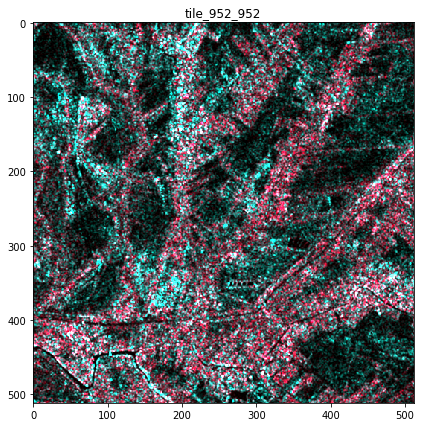

In [40]:
from dataflow.io_utils import read_image


dp = {
    'image': read_image(df.loc[48, 'img_path']),
#     'mask': read_image(df.loc[1033, 'img_path']),
    'meta': {'image_path': df.loc[504, 'img_path']}
}

display_image_mask(dp)

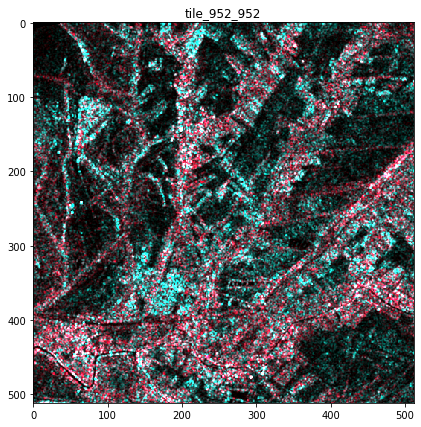

In [41]:
from dataflow.io_utils import read_image


dp = {
    'image': read_image(df.loc[577, 'img_path']),
#     'mask': read_image(df.loc[1033, 'img_path']),
    'meta': {'image_path': df.loc[504, 'img_path']}
}

display_image_mask(dp)

In [22]:
df[]

,index,img_min,img_max,img_mean,img_std,target_ratio,fold_index,skip,img_path,city,tile_id
504,504,"(0.0, -0.0010406391, 0.0)","(0.122678354, 1.2602835, 0.64747834)","(0.0018115111, 0.012047057, 0.006929278)","(0.0062981076, 0.041241463, 0.023069412)",0.000000,1,False,../input/train_tiles/images/20150408_38RPV_2_s...,20150408_38RPV_2_s1a_38RPV_3b_ASC_20150408t145...,tile_952_952
1033,1033,"(0.0, 0.0, 0.0)","(0.0538872, 0.3075939, 0.17351516)","(8.117693e-05, 0.0004969851, 0.0002890811)","(0.0009477326, 0.0055406285, 0.0031580096)",0.000000,1,False,../input/train_tiles/images/s1a_38RPV_3b_ASC_2...,s1a_38RPV_3b_ASC_20150114t145841_tiles,tile_952_952
1562,1562,"(0.0, -0.0010406391, 0.0)","(0.122678354, 1.2602835, 0.64747834)","(0.0018115111, 0.012047057, 0.006929278)","(0.0062981076, 0.041241463, 0.023069412)",0.000000,1,False,../input/train_tiles/images/s1a_38RPV_3b_ASC_2...,s1a_38RPV_3b_ASC_20150408t145842_tiles,tile_952_952
2091,2091,"(0.0, -0.0017882803, 0.0)","(0.1845816, 0.97507817, 0.5076416)","(0.0020773637, 0.011934253, 0.0070058205)","(0.007270182, 0.039481126, 0.022609677)",0.000000,1,False,../input/train_tiles/images/s1a_38RPV_3b_ASC_2...,s1a_38RPV_3b_ASC_20150713t145847_tiles,tile_952_952
2620,2620,"(0.0, 0.0, 0.0)","(0.15581673, 0.91071445, 0.4671923)","(0.0019841734, 0.012453139, 0.007218678)","(0.0067647877, 0.040302593, 0.02279138)",0.000000,1,False,../input/train_tiles/images/s1a_38RPV_3b_ASC_2...,s1a_38RPV_3b_ASC_20151017t145850_tiles,tile_952_952
3149,3149,"(0.00031084585, -0.14289142, -0.05381976)","(0.7688615, 35.151646, 17.59406)","(0.033638254, 0.17219204, 0.10291511)","(0.02844625, 0.2895357, 0.15270256)",0.018833,0,False,../input/train_tiles/images/s1a_38SLF_3b_20150...,s1a_38SLF_3b_20150426_tiles,tile_952_952
3678,3678,"(-0.0050917766, -0.08413547, -0.0362754)","(1.0150533, 16.952175, 8.748912)","(0.03293316, 0.22517191, 0.12905282)","(0.03649856, 0.4086508, 0.21658938)",0.018833,0,False,../input/train_tiles/images/s1a_38SLF_3b_DES_2...,s1a_38SLF_3b_DES_20150108t030926_tiles,tile_952_952
4207,4207,"(-0.004218727, -0.18838283, -0.092115596)","(2.3879178, 27.385328, 14.525973)","(0.0432561, 0.23478971, 0.13902298)","(0.051233333, 0.39851546, 0.21640255)",0.018833,0,False,../input/train_tiles/images/s1a_38SLF_3b_DES_2...,s1a_38SLF_3b_DES_20150812t030933_tiles,tile_952_952
4736,4736,"(-0.00504473, -0.22963749, -0.11144129)","(1.3939707, 17.95746, 9.123552)","(0.027568415, 0.15835455, 0.09296138)","(0.0318926, 0.29434225, 0.15768383)",0.018833,0,False,../input/train_tiles/images/s1a_38SLF_3b_DES_2...,s1a_38SLF_3b_DES_20151222t030932_tiles,tile_952_952
5265,5265,"(0.00051611837, -0.00088869216, 0.0040195845)","(0.2511814, 5.1583776, 2.5986521)","(0.017111598, 0.08535016, 0.051230412)","(0.013524999, 0.07615652, 0.041413628)",0.000000,2,False,../input/train_tiles/images/s1a_38SMA_3b_ASC_2...,s1a_38SMA_3b_ASC_20150114t145906_tiles,tile_952_952


In [4]:
from dataflow.datasets import get_trainval_datasets 

In [4]:
train_folds = [0, 1, 3]
val_folds = [2, ]

train_ds, val_ds = get_trainval_datasets(data_path, csv_path, train_folds=train_folds, val_folds=val_folds)

In [5]:
len(train_ds), len(val_ds)

(6231, 1888)

Data histograms

In [6]:
import torch
import numpy as np
import matplotlib.pylab as plt
%matplotlib inline


def display_datapoint_hists_per_channel(dp, ylog=True):
    img = dp['image']
    c = img.shape[-1]
    plt.figure(figsize=(5 * c, 5))
    for j in range(c):
        plt.subplot(1, c, j + 1)
        plt.title("channel={}".format(j))
        _ = plt.hist(img[:, :, j].ravel(), bins=255)
        plt.yscale('log')

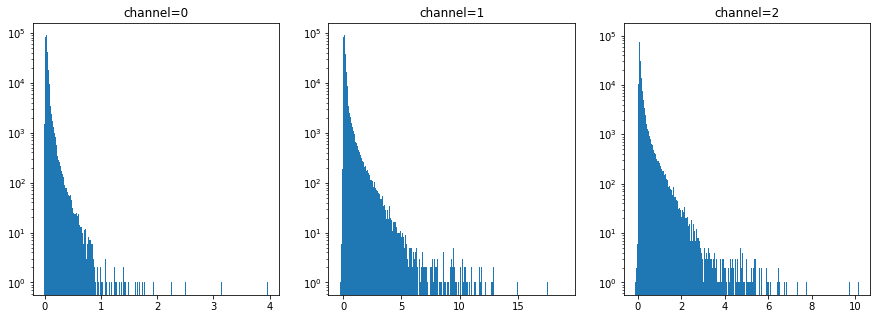

In [7]:
display_datapoint_hists_per_channel(train_ds[0])

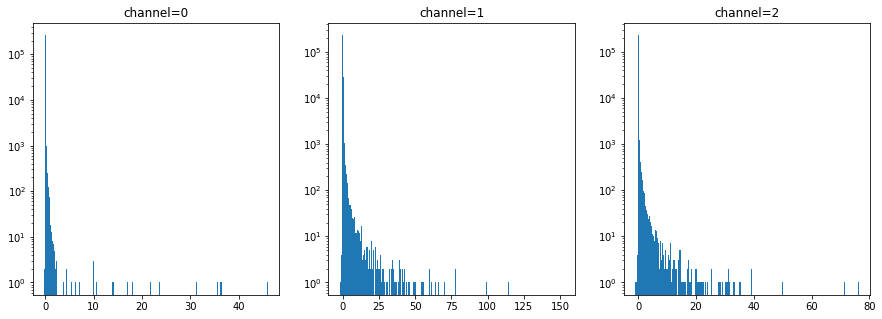

In [8]:
display_datapoint_hists_per_channel(train_ds[10])

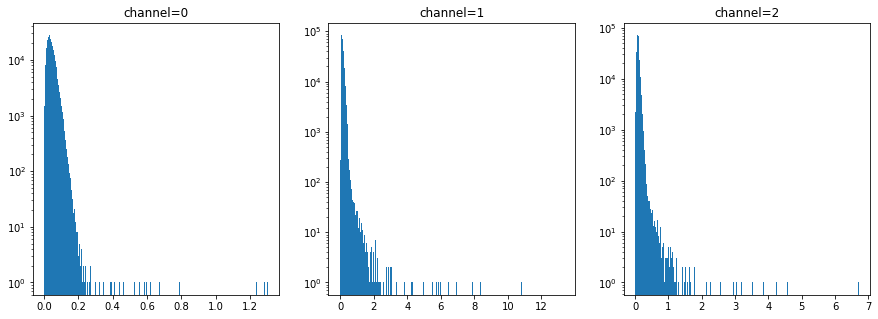

In [9]:
display_datapoint_hists_per_channel(train_ds[100])

Dataloader and visualization

In [10]:
from dataflow.dataloaders import get_train_val_loaders, get_train_sampler

In [11]:
from dataflow.vis import make_grid

import numpy as np
import matplotlib.pylab as plt
%matplotlib inline

In [19]:
import albumentations as A
from albumentations.pytorch import ToTensorV2

train_img_size = 496

mean = (0.0, 0.0, 0.0)
std = (1.0, 1.0, 1.0)
max_value = 1.0


train_transforms = A.Compose([
    A.RandomCrop(train_img_size, train_img_size),
    A.OneOf([
        A.RandomRotate90(),
        A.Flip(),        
    ]),
    A.Normalize(mean=mean, std=std, max_pixel_value=max_value),
    ToTensorV2()
])


val_transforms = A.Compose([
    A.Normalize(mean=mean, std=std, max_pixel_value=max_value),
    ToTensorV2()
])

In [20]:
train_sampler = get_train_sampler(train_ds, weight_per_class=(0.7, 0.3))

In [21]:
!ls /tmp/unosat

'train_sampler_weights_6198__[0.5_0.5].pth'
'train_sampler_weights_6231__(0.65_0.35).pth'
'train_sampler_weights_6231__(0.7_0.3).pth'


In [22]:
train_loader, val_loader, train_eval_loader = get_train_val_loaders(
    train_ds,
    val_ds,
    train_transforms=train_transforms,
    val_transforms=val_transforms,
    batch_size=4,
    num_workers=10,
    val_batch_size=4,
    train_sampler=train_sampler
)

In [23]:
train_loader_iter = iter(train_loader)
val_loader_iter = iter(val_loader)
train_eval_loader_iter = iter(train_eval_loader)

Train loader

In [24]:
batch = next(train_loader_iter)

In [25]:
batch['image'].max(), batch['image'].min()

(tensor(0.5000), tensor(-0.5000))

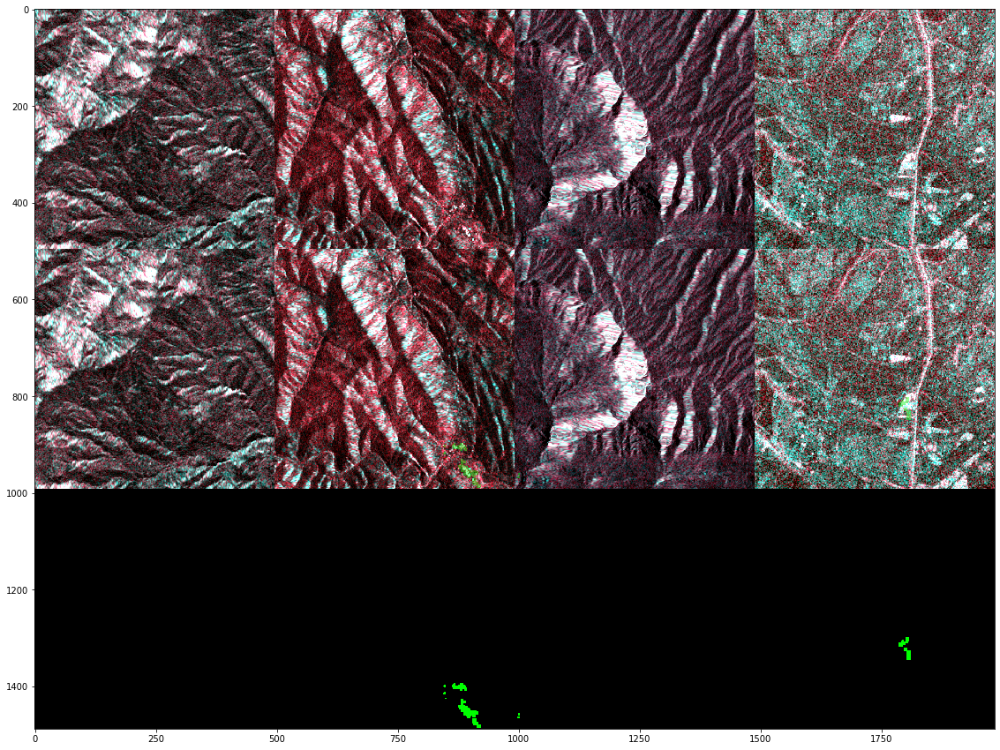

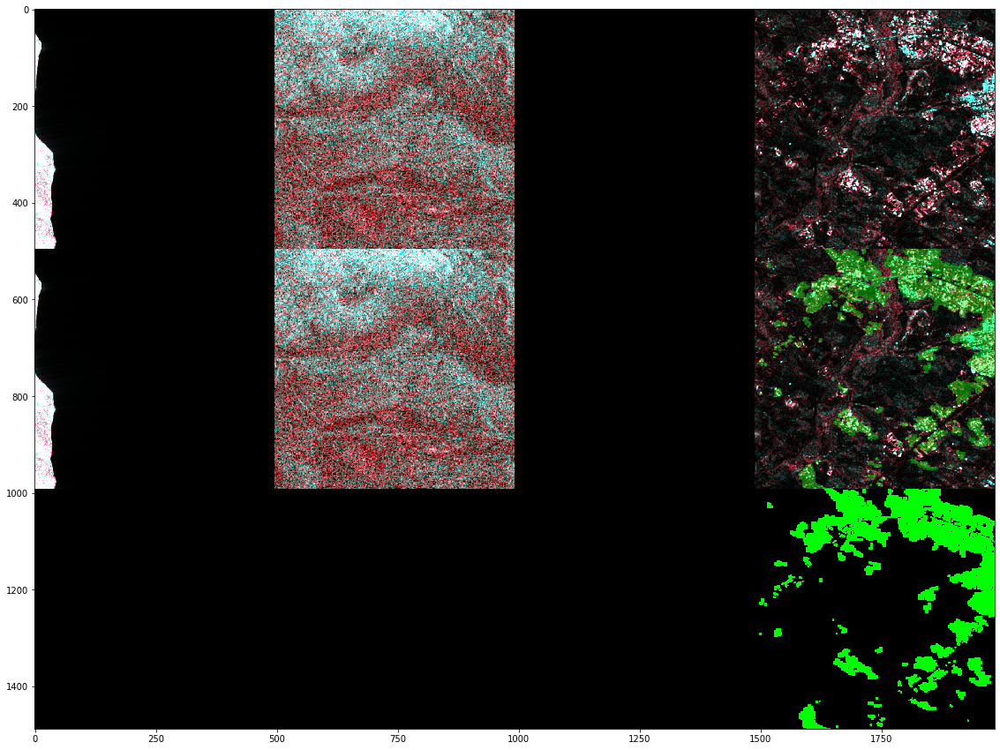

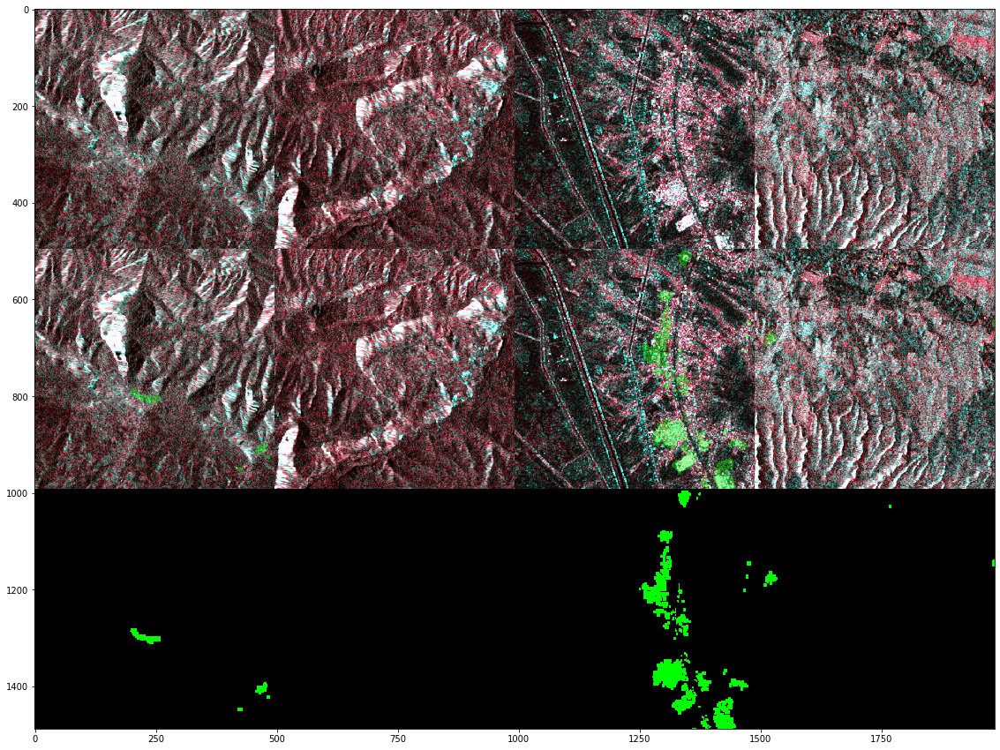

In [27]:
from functools import partial


for _ in range(3):
    batch = next(train_loader_iter)

    batch_x = batch['image']
    batch_y = batch['mask']
    
    plt.figure(figsize=(30, 15))
    grid_pred_gt = make_grid(batch_x[:, :, :, :], batch_y, 
                             img_denormalize_fn=lambda x: x)
    plt.imshow(grid_pred_gt)

Val loader

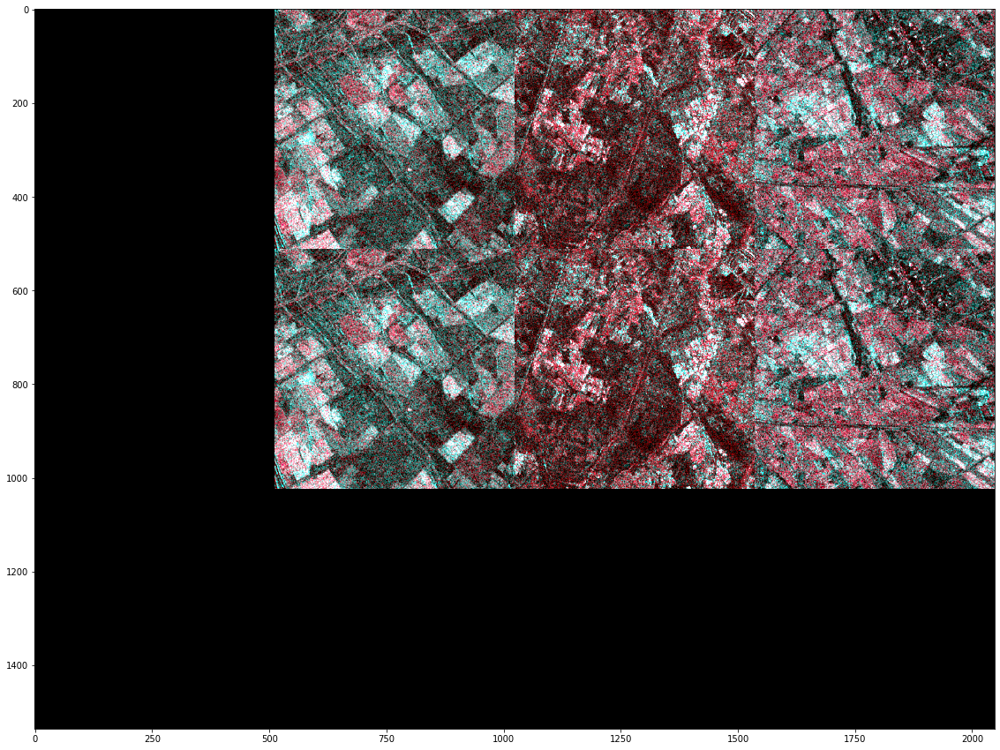

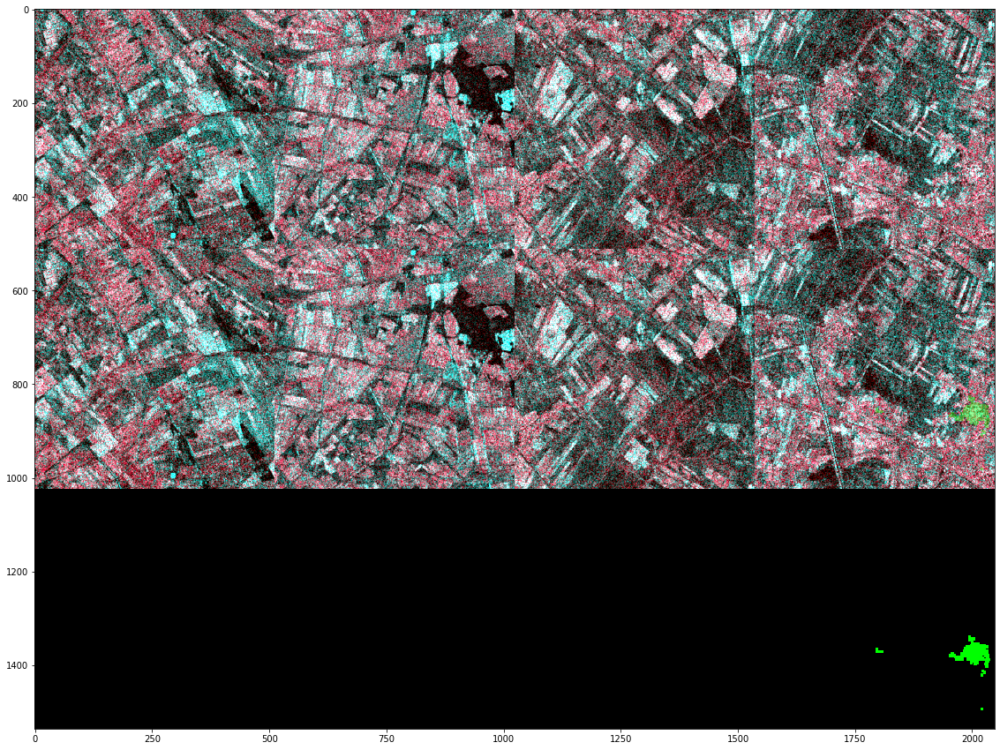

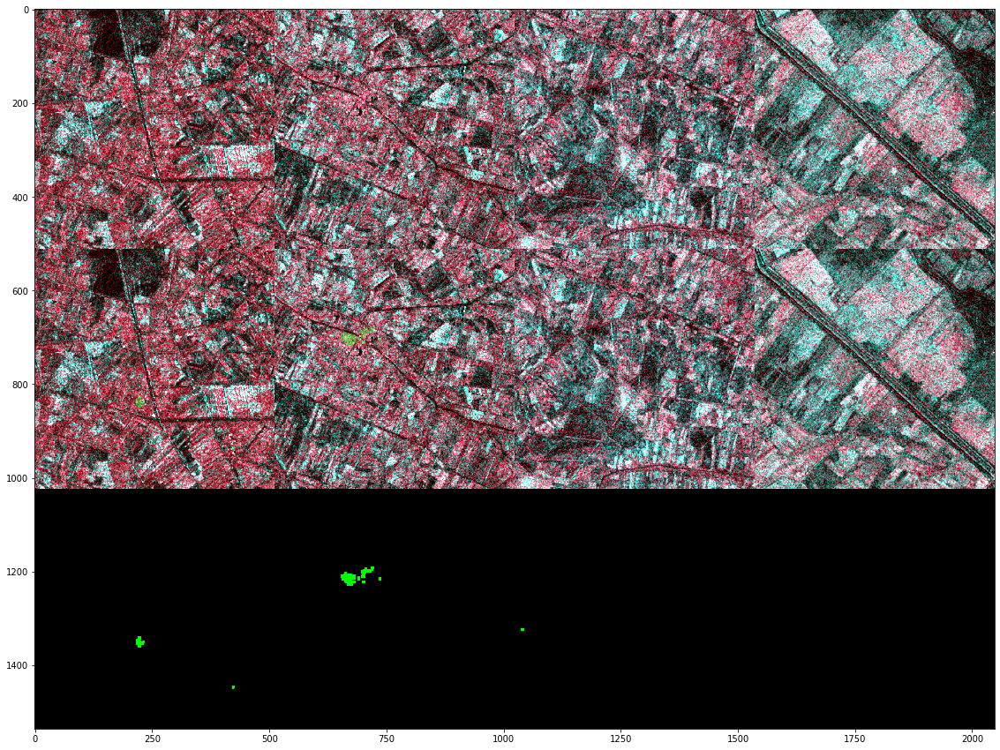

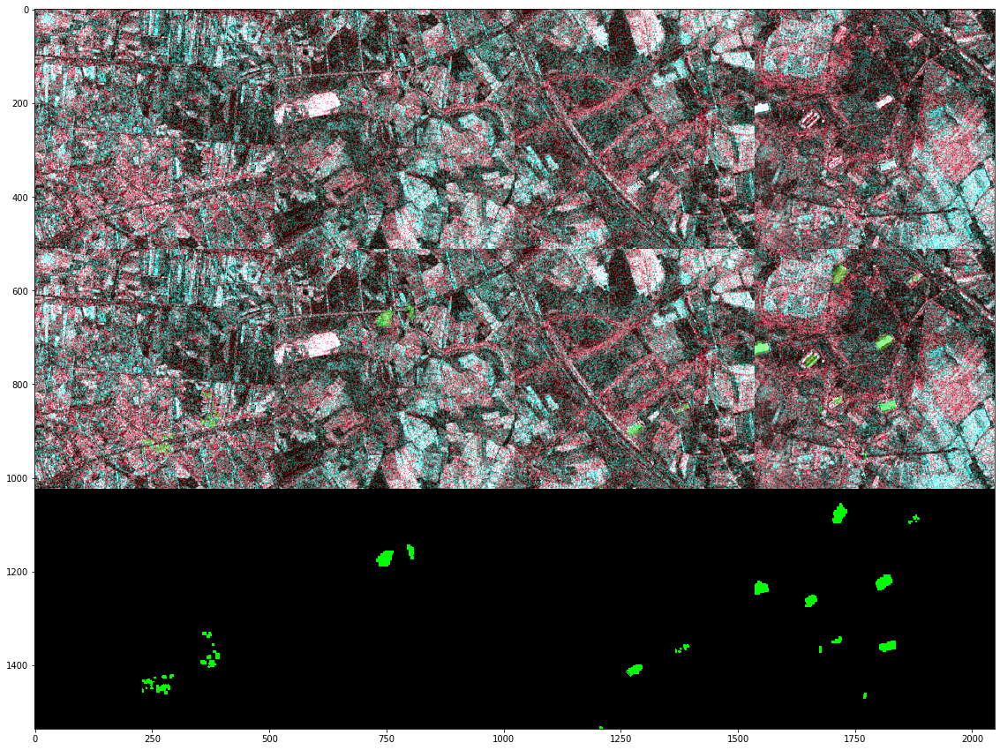

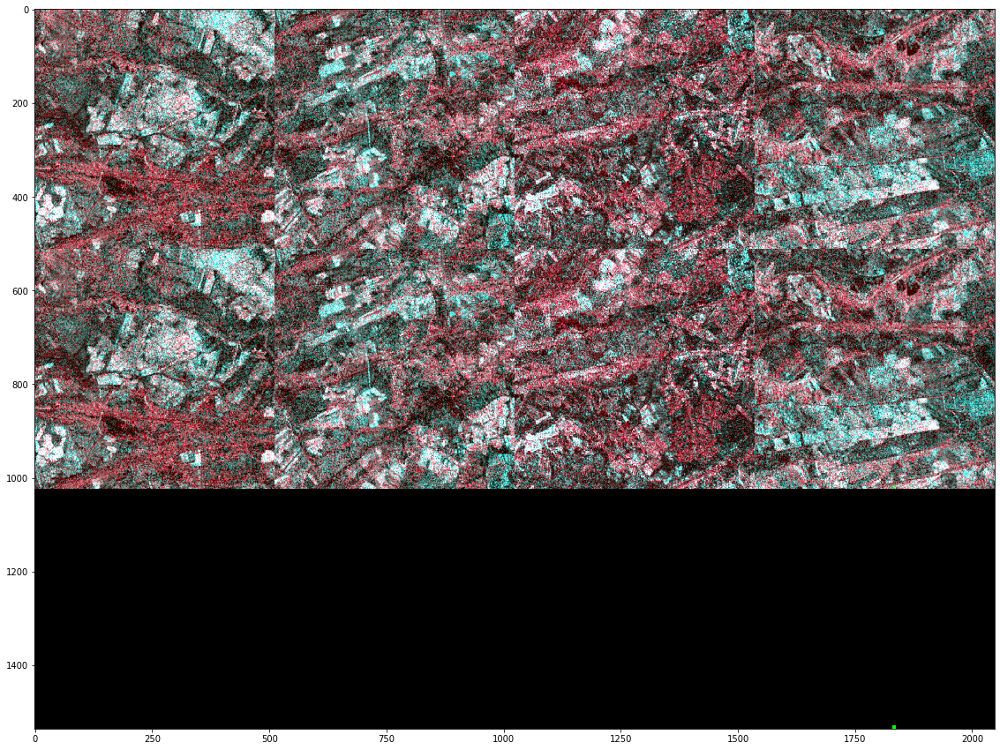

In [28]:
from functools import partial


for _ in range(5):
    batch = next(val_loader_iter)

    batch_x = batch['image']
    batch_y = batch['mask']
    
    plt.figure(figsize=(30, 15))
    grid_pred_gt = make_grid(batch_x[:, :, :, :], batch_y, 
                             img_denormalize_fn=lambda x: x)
    plt.imshow(grid_pred_gt)

In [53]:
def lambda_lr_scheduler(iteration, lr0, n, a):
    if iteration < n // 2:
        n = n // 2
        return lr0 * pow((1.0 - 1.0 * iteration / n), a)
    else:
        iteration -= n // 2
        n -= n // 2 + 1
        return 0.5 * lr0 * pow((1.0 - 1.0 * iteration / n), a)


In [54]:
import matplotlib.pylab as plt
%matplotlib inline

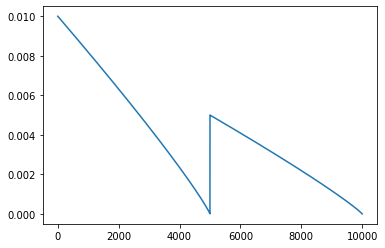

In [55]:
n = 200 * 50
lr0 = 0.01
a = 0.9


iters = list(range(n))
lr_vals = [lambda_lr_scheduler(i, lr0, n, a) for i in iters]


plt.plot(iters, lr_vals)

In [56]:
lr_vals[-1]

0.0